<a href="https://colab.research.google.com/github/kiro358/Brain-Segmentation-MRI-Preprocessing/blob/main/Capstone_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#For Reference


In [ ]:
# #for segmentation
# !pip install --upgrade tensorflow
# !pip install tensorflow-keras
# !pip install git+https://github.com/qubvel/segmentation_models

# # for handling MRI images
# !pip install nipype
# !pip install antspyx
# !pip install nilearn

# # #for running ANTS library in
# from google.colab import drive
# drive.mount('/gdrive')
# # !cp -r '/gdrive/My Drive/ANTS/bin' ./
# !cp '/gdrive/My Drive/ANTs-28-03-2019.7z' ./
# !7z x ANTs-28-03-2019.7z
# !cp bin/* /usr/local/bin


# import segmentation_models as sm
# import tensorflow.python.ops.ragged.ragged_tensor as rt
# from segmentation_models.metrics import iou_score
# focal_loss = sm.losses.cce_dice_loss
# from nipype.interfaces.slicer.filtering.n4itkbiasfieldcorrection import N4ITKBiasFieldCorrection
# from nipype import Node, Workflow
# from nilearn.image import resample_img
# from sklearn.model_selection import train_test_split
# import random

In [ ]:
#downloading the dataset
!wget --header 'Host: fcp-indi.s3.amazonaws.com' --user-agent 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:87.0) Gecko/20100101 Firefox/87.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' --header 'Accept-Language: en-US,en;q=0.5' --referer 'http://preprocessed-connectomes-project.org/' --header 'Upgrade-Insecure-Requests: 1' 'https://fcp-indi.s3.amazonaws.com/data/Projects/RocklandSample/NFBS_Dataset.tar.gz' --output-document 'NFBS_Dataset.tar.gz'
!wget --header 'Host: doc-08-2g-docs.googleusercontent.com' --user-agent 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:87.0) Gecko/20100101 Firefox/87.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' --header 'Accept-Language: en-US,en;q=0.5' --referer 'https://drive.google.com/' --header 'Cookie: AUTH_9k7m8g8qrj7at7i0b1sl7f8s8gafrr77_nonce=fchj71prkosgs' --header 'Upgrade-Insecure-Requests: 1' 'https://doc-08-2g-docs.googleusercontent.com/docs/securesc/5baff4djp5n2ak1832to2m6lltldb4gl/lld851i2e7pqe774volddlu45niullkl/1621202400000/00677992938550103544/12785117600840412092/1N1Qx-R5tLCX5EhXPoPdyg6YvEkDtf-cD?e=download&authuser=0&nonce=fchj71prkosgs&user=12785117600840412092&hash=0lccq4nigav75jop1timeo66ook4s4q1' --output-document 'ANTs-28-03-2019.7z'
!wget --header 'Host: doc-00-48-docs.googleusercontent.com' --user-agent 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:87.0) Gecko/20100101 Firefox/87.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' --header 'Accept-Language: en-US,en;q=0.5' --referer 'https://drive.google.com/' --header 'Cookie: AUTH_9k7m8g8qrj7at7i0b1sl7f8s8gafrr77=12785117600840412092|1621202400000|urd0fgd911j76j00e1g3sfrlmgno1864' --header 'Upgrade-Insecure-Requests: 1' 'https://doc-00-48-docs.googleusercontent.com/docs/securesc/5baff4djp5n2ak1832to2m6lltldb4gl/andn6io8vgl8gpaplbqeg39eum6c4c3k/1621202475000/15988357211529156717/12785117600840412092/1y8N6JpKhyoLDQcscdudwMCgqubjQyfd1?e=download&authuser=0' --output-document 'T1w_MRI_test_data.zip'
!unzip '/content/T1w_MRI_test_data.zip'

!pip install SimpleITK

--2024-02-27 18:07:04--  https://fcp-indi.s3.amazonaws.com/data/Projects/RocklandSample/NFBS_Dataset.tar.gz
Resolving fcp-indi.s3.amazonaws.com (fcp-indi.s3.amazonaws.com)... 52.217.236.73, 52.216.239.187, 3.5.28.145, ...
Connecting to fcp-indi.s3.amazonaws.com (fcp-indi.s3.amazonaws.com)|52.217.236.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1751464473 (1.6G) [application/x-tar]
Saving to: ‘NFBS_Dataset.tar.gz’

NFBS_Dataset.tar.gz 100%[===================>]   1.63G  44.2MB/s    in 46s     

2024-02-27 18:07:50 (36.0 MB/s) - ‘NFBS_Dataset.tar.gz’ saved [1751464473/1751464473]

--2024-02-27 18:07:50--  https://doc-08-2g-docs.googleusercontent.com/docs/securesc/5baff4djp5n2ak1832to2m6lltldb4gl/lld851i2e7pqe774volddlu45niullkl/1621202400000/00677992938550103544/12785117600840412092/1N1Qx-R5tLCX5EhXPoPdyg6YvEkDtf-cD?e=download&authuser=0&nonce=fchj71prkosgs&user=12785117600840412092&hash=0lccq4nigav75jop1timeo66ook4s4q1
Resolving doc-08-2g-docs.googleuserc

# NeuroDesk

In [ ]:
import os
os.environ["LD_PRELOAD"] = "";
os.environ["APPTAINER_BINDPATH"] = "/content"
os.environ["LMOD_CMD"] = "/usr/share/lmod/lmod/libexec/lmod"

!curl -J -O https://raw.githubusercontent.com/NeuroDesk/neurocommand/main/googlecolab_setup.sh
!chmod +x googlecolab_setup.sh
!./googlecolab_setup.sh
os.environ["MODULEPATH"] = ':'.join(map(str, list(map(lambda x: os.path.join(os.path.abspath('/cvmfs/neurodesk.ardc.edu.au/neurodesk-modules/'), x),os.listdir('/cvmfs/neurodesk.ardc.edu.au/neurodesk-modules/')))))

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  3421  100  3421    0     0  18246      0 --:--:-- --:--:-- --:--:-- 18196
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
lsb-release is already the newest version (11.1.0ubuntu4).
lsb-release set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
--2024-02-27 18:10:11--  https://ecsft.cern.ch/dist/cvmfs/cvmfs-release/cvmfs-release-latest_all.deb
Resolving ecsft.cern.ch (ecsft.cern.ch)... 188.184.97.7
Connecting to ecsft.cern.ch (ecsft.cern.ch)|188.184.97.7|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5284 (5.2K)
Saving to: ‘cvmfs-release-latest_all.deb’

cvmfs-release-lates 100%[===================>]   5.16K  --.-KB/s    in 0s      

2024-02-27 18:10:11 (353 MB/s) - ‘cvmfs-release-latest_all.deb’ saved [5284/5284

In [ ]:
# from google.colab import drive
# drive.mount('/gdrive')

#loading ML dependancies
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from nibabel.testing import data_path
os.environ["SM_FRAMEWORK"] = "tf.keras"
import nibabel as nib
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

from nipype.interfaces.slicer.filtering.n4itkbiasfieldcorrection import N4ITKBiasFieldCorrection
from nipype import Node, Workflow
from nilearn.image import resample_img

import SimpleITK as sitk
from nilearn.image import math_img
from nilearn import image as nii
from nilearn import plotting
from nipype.interfaces.ants import N4BiasFieldCorrection

In [ ]:
# #Extracting nfbs dataset
import tarfile
file = tarfile.open('/content/NFBS_Dataset.tar.gz')
file.extractall('/content/')
file.close()

Each folder contains 3 types of images in nifti format..

T1weighted :This is the raw MRI image with a single channel. Image is 3D and can be imagined as multiple 2D images stacked together.

T1w_brainmask: It is the image mask of the brain or can be called as the ground truth. It is obtained using Beast(Brain extraction based on non local segmentation) method and applying manual edits by domain experts to remove non brain tissue.

T1w_brain:This can be thought of as part of brain stripped from above T1weighted image. This is similar to overlaying mask to actual images.

Objective: Our task here is to build a pipeline that takes in T1 weighted and generates a skull stripped mask.

In [ ]:
#storing the address of 3 types of files
import os
brain_mask=[]
brain=[]
raw=[]
for subdir, dirs, files in os.walk('/content/NFBS_Dataset'):
    for file in files:
        #print os.path.join(subdir, file)y
        filepath = subdir + os.sep + file

        if filepath.endswith(".gz"):
          if '_brainmask.' in filepath:
            brain_mask.append(filepath)
          elif '_brain.' in filepath:
            brain.append(filepath)
          else:
            raw.append(filepath)

In [ ]:
#creating a dataframe for ease of use..
data=pd.DataFrame({'brain_mask':brain_mask,'brain':brain,'raw':raw})
data.head()
# trunc_brain_mask = brain_mask[:5]
# trunc_brain = brain[:5]
# trunc_raw = raw[:5]
# data=pd.DataFrame({'brain_mask':trunc_brain_mask,'brain':trunc_brain,'raw':trunc_raw})
# data.head()

,brain_mask,brain,raw
0,/content/NFBS_Dataset/A00054019/sub-A00054019_...,/content/NFBS_Dataset/A00054019/sub-A00054019_...,/content/NFBS_Dataset/A00054019/sub-A00054019_...
1,/content/NFBS_Dataset/A00059346/sub-A00059346_...,/content/NFBS_Dataset/A00059346/sub-A00059346_...,/content/NFBS_Dataset/A00059346/sub-A00059346_...
2,/content/NFBS_Dataset/A00056627/sub-A00056627_...,/content/NFBS_Dataset/A00056627/sub-A00056627_...,/content/NFBS_Dataset/A00056627/sub-A00056627_...
3,/content/NFBS_Dataset/A00043721/sub-A00043721_...,/content/NFBS_Dataset/A00043721/sub-A00043721_...,/content/NFBS_Dataset/A00043721/sub-A00043721_...
4,/content/NFBS_Dataset/A00040623/sub-A00040623_...,/content/NFBS_Dataset/A00040623/sub-A00040623_...,/content/NFBS_Dataset/A00040623/sub-A00040623_...



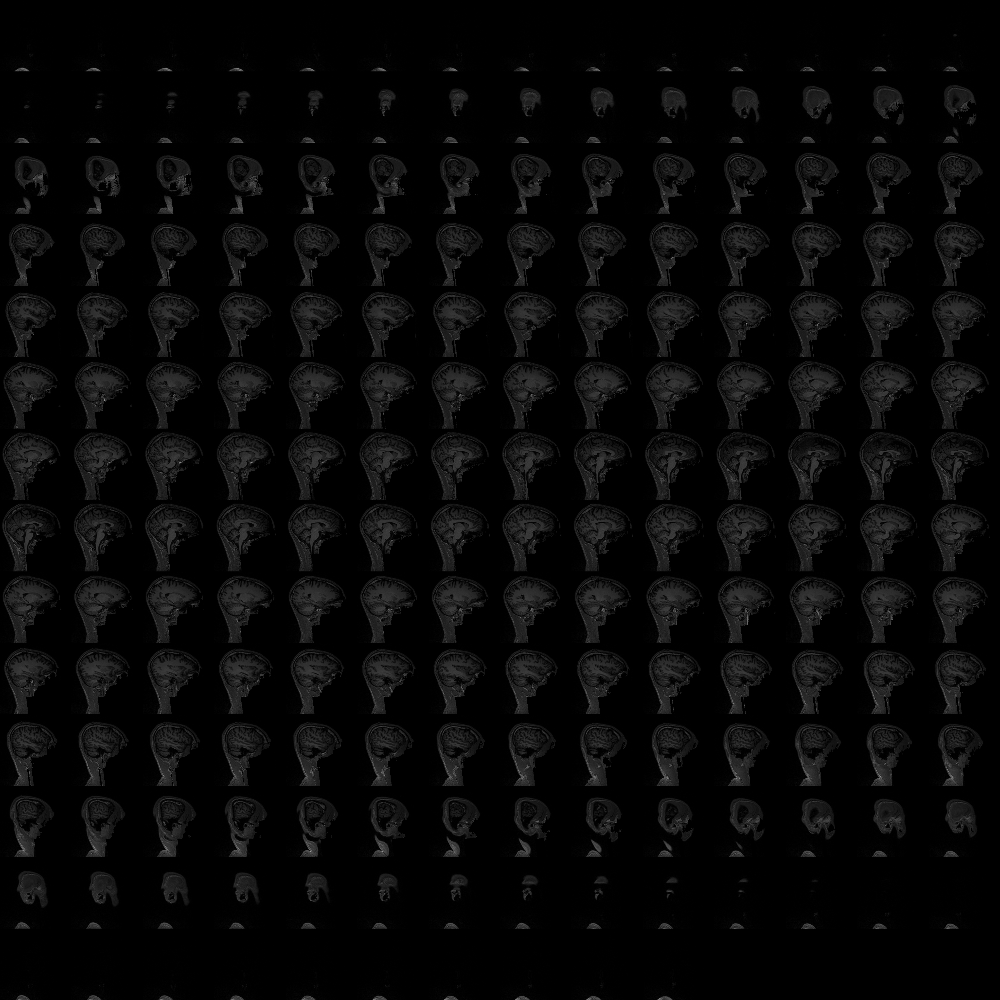
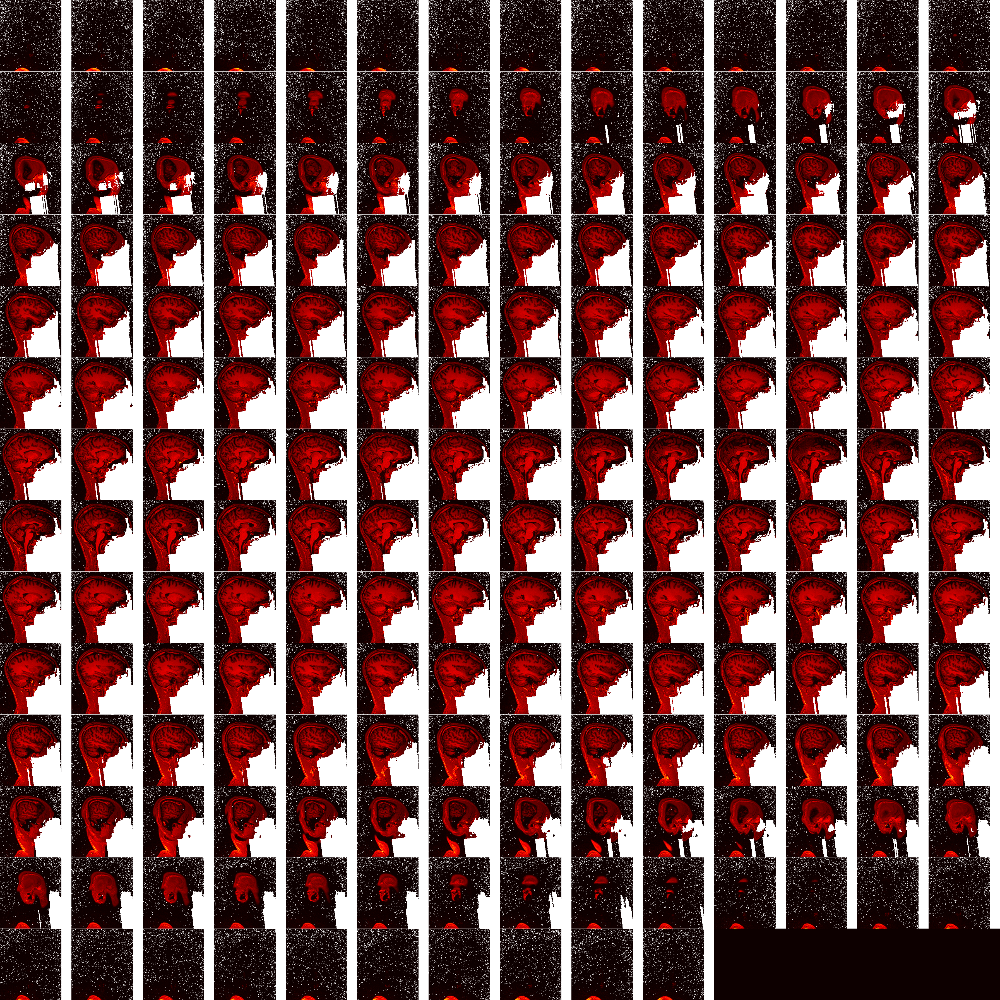

In [ ]:
#interactive plot
img=nii.mean_img('/content/NFBS_Dataset/A00028185/sub-A00028185_ses-NFB3_T1w.nii.gz')
plotting.view_img(img,bg_img=img)

In [ ]:
import lmod
await lmod.load('fsl/6.0.4')
await lmod.list()
await lmod.avail()
await lmod.load('hdbet/1.0.0')

In [ ]:
%%bash
which bet

/cvmfs/neurodesk.ardc.edu.au/containers/fsl_6.0.4_20210105/bet


In [ ]:
!bet


Usage:    bet <input> <output> [options]

Main bet2 options:
  -o          generate brain surface outline overlaid onto original image
  -m          generate binary brain mask
  -s          generate approximate skull image
  -n          don't generate segmented brain image output
  -f <f>      fractional intensity threshold (0->1); default=0.5; smaller values give larger brain outline estimates
  -g <g>      vertical gradient in fractional intensity threshold (-1->1); default=0; positive values give larger brain outline at bottom, smaller at top
  -r <r>      head radius (mm not voxels); initial surface sphere is set to half of this
  -c <x y z>  centre-of-gravity (voxels not mm) of initial mesh surface.
  -t          apply thresholding to segmented brain image and mask
  -e          generates brain surface as mesh in .vtk format

Variations on default bet2 functionality (mutually exclusive options):
  (default)   just run bet2
  -R          robust brain centre estimation (iterates BE

In [ ]:
%%bash
curl -J -O "https://files.au-1.osf.io/v1/resources/bt4ez/providers/osfstorage/5e9bf3ab430166067ea05564?action=download&direct&version=1"
ls -la

total 100832
drwxr-xr-x 1 root root     4096 Feb 23 22:32 .
drwxr-xr-x 1 root root     4096 Feb 23 22:26 ..
-rw-r--r-- 1 root root 25471036 Jul 19  2023 apptainer_1.2.0_amd64.deb
-rw-r--r-- 1 root root  5064744 Jul 19  2023 apptainer-suid_1.2.0_amd64.deb
drwxr-xr-x 4 root root     4096 Feb 22 14:24 .config
-rw-r--r-- 1 root root     5284 Sep  4 11:09 cvmfs-release-latest_all.deb
-rwxr-xr-x 1 root root     3421 Feb 23 22:25 googlecolab_setup.sh
drwxr-xr-x 1 root root     4096 Feb 22 14:24 sample_data
-rw-r--r-- 1 root root 72682635 Feb 23 22:32 sub-01_ses-01_7T_T1w_defaced.nii.gz


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0Warning: Failed to create the file sub-01_ses-01_7T_T1w_defaced.nii.gz: File 
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
curl: (23) Failed writing header


In [ ]:
def intensity_normalization(input_path, output_path):
  image = sitk.ReadImage(input_path)
  resacleFilter = sitk.RescaleIntensityImageFilter()
  resacleFilter.SetOutputMaximum(255)
  resacleFilter.SetOutputMinimum(0)
  image = resacleFilter.Execute(image)
  sitk.WriteImage(image,output_path)
  print('Normalization done.')

In [ ]:
from matplotlib import transforms
from scipy import ndimage

def view_slices_3d(image_3d, slice_nbr, vmin, vmax, title=''):
  fig = plt.figure(figsize=(15, 4))
  plt.suptitle(title, fontsize=10)

  plt.subplot(131)
  plt.imshow(np.take(image_3d, slice_nbr, 2), vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Axial');

  plt.subplot(132)
  image_rot = ndimage.rotate(np.take(image_3d, slice_nbr, 1),90)
  plt.imshow(image_rot, vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Coronal');

  plt.subplot(133)
  image_rot = ndimage.rotate(np.take(image_3d, slice_nbr, 0),90)
  plt.imshow(image_rot, vmin=vmin, vmax=vmax, cmap='gray')
  plt.title('Sagittal');
  cbar=plt.colorbar()

In [ ]:
mni152_template = "/cvmfs/neurodesk.ardc.edu.au/containers/fsl_6.0.4_20210105/fsl_6.0.4_20210105.simg/opt/fsl-6.0.4/data/standard/MNI152_T1_2mm_brain.nii.gz"
input_file = "sub-01_ses-01_7T_T1w_defaced.nii.gz"
std_file = input_file[:-7] + "_std.nii.gz"
bet_file = std_file[:-7] + "_bet.nii.gz"
mni152_file = std_file[:-7] + "_mni152.nii.gz"
normalized_file = mni152_file[:-7] + "_nomalized.nii.gz"

In [ ]:
!fslreorient2std {input_file} {std_file}

In [ ]:
!hd-bet -i {std_file} -device cpu -mode fast -tta 0


########################
If you are using hd-bet, please cite the following paper:
Isensee F, Schell M, Tursunova I, Brugnara G, Bonekamp D, Neuberger U, Wick A, Schlemmer HP, Heiland S, Wick W,Bendszus M, Maier-Hein KH, Kickingereder P. Automated brain extraction of multi-sequence MRI using artificialneural networks. arXiv preprint arXiv:1901.11341, 2019.
########################

File: sub-01_ses-01_7T_T1w_defaced_std.nii.gz
preprocessing...
image shape after preprocessing:  (149, 134, 96)
prediction (CNN id)...
0
running postprocessing... 
/opt/HD-BET/HD_BET/utils.py:74: UserWarning: The argument 'neighbors' is deprecated and will be removed in scikit-image 0.18, use 'connectivity' instead. For neighbors=8, use connectivity=3
  lbls = label(mask, 8)
exporting segmentation...


In [ ]:
# !bet {std_file} {bet_file}  -f 0.2 -R

In [ ]:
!flirt -in {bet_file} -ref /opt/fsl-6.0.4/data/standard/MNI152_T1_2mm_brain.nii.gz -out {mni152_file}


Final result: 
1.144695 -0.007371 0.004523 8.878653 
0.003808 1.015989 0.245833 -22.248106 
-0.006462 -0.259341 1.106689 -49.453438 
0.000000 0.000000 0.000000 1.000000 



In [ ]:
intensity_normalization(mni152_file, normalized_file)

Normalization done.


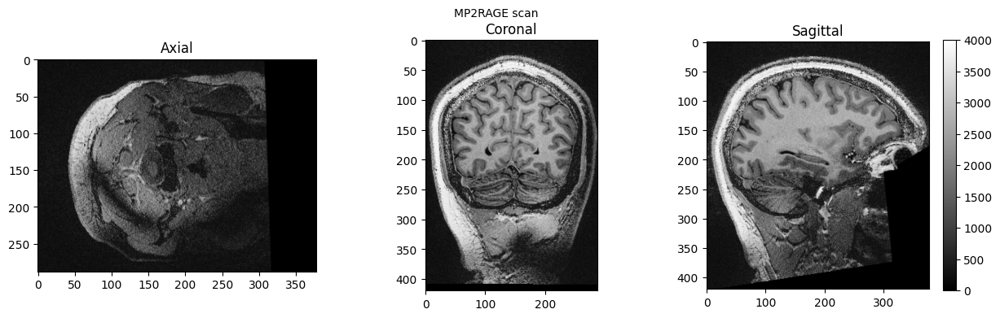

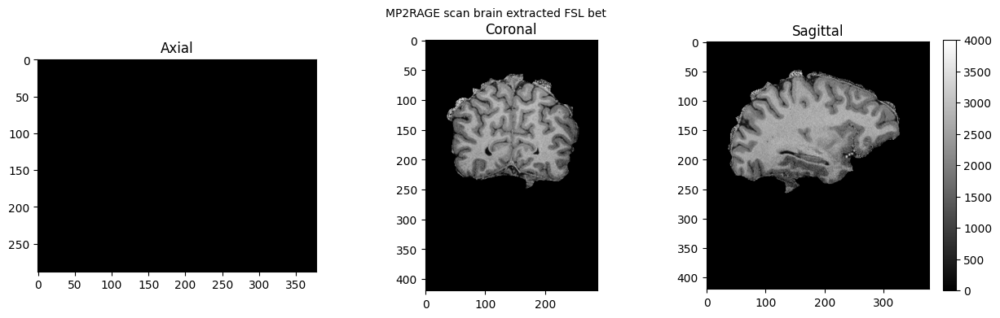

In [ ]:
# load data and display
brain = nib.load(input_file).get_fdata()
brain_extracted = nib.load(bet_file).get_fdata()
view_slices_3d(brain, slice_nbr=85, vmin=0, vmax=4000, title='MP2RAGE scan')
view_slices_3d(brain_extracted, slice_nbr=85, vmin=0, vmax=4000, title='MP2RAGE scan brain extracted FSL bet')

In [ ]:
# import SimpleITK as sitk
from nilearn.image import resample_to_img

structural_img = nib.load(bet_file)
template = nib.load(mni152_template)
output_path = '/content/resampled'

# Resample the structural image to the MNI152 template
resampled_img = resample_to_img(structural_img, mni152_template, interpolation='continuous')

# Save the resampled image
nib.save(resampled_img, output_path)

# Display the original and resampled images for comparison
plotting.plot_anat(bet_file, title='Original Structural Image', display_mode='ortho', cut_coords=(0, 0, 0), colorbar=True)
plotting.plot_anat(output_path, title='Resampled to MNI152 Template', display_mode='ortho', cut_coords=(0, 0, 0), colorbar=True)
plotting.show()

NameError: name 'output_path' is not defined

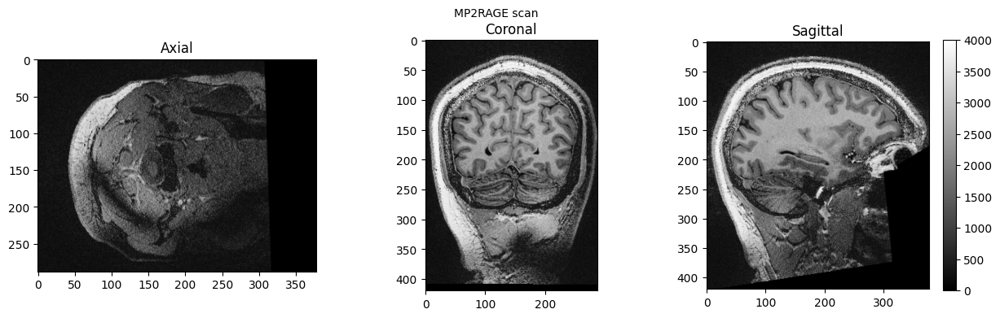

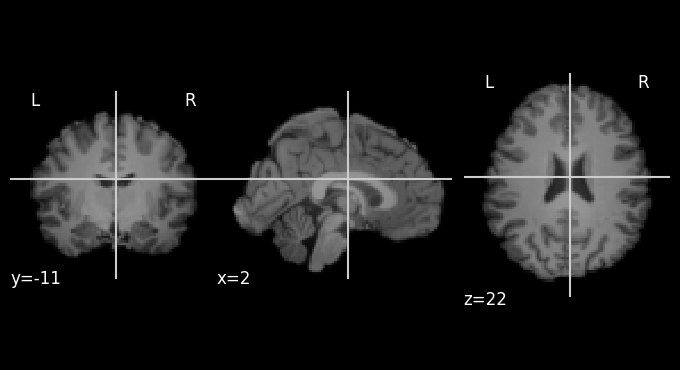

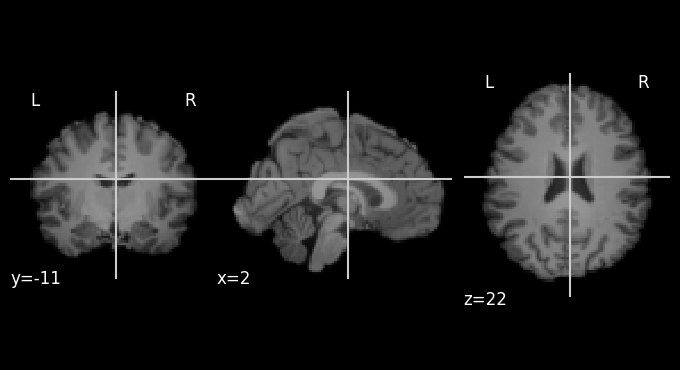

In [ ]:
# load data and display
brain = nib.load(input_file).get_fdata()
# brain_extracted = nib.load("/content/sub-01_std_bet.nii.gz").get_fdata()
view_slices_3d(brain, slice_nbr=85, vmin=0, vmax=4000, title='MP2RAGE scan')
# view_slices_3d(brain_extracted, slice_nbr=85, vmin=0, vmax=4000, title='MP2RAGE scan brain extracted FSL bet')

# Display the anatomical image
plotting.plot_anat(mni152_file)
plotting.show()

# Display the anatomical image
plotting.plot_anat(normalized_file)
plotting.show()